In [1]:
import pandas as pd
import numpy as np
from sklearn import datasets
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import warnings


warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [7]:
df = pd.read_csv('d:\\Learning\\Otus\\ML_Professional\\exercises\\6_hw\\WA_Fn-UseC_-Telco-Customer-Churn.csv', index_col = 0)
df.head() 

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## Часть 1. EDA

In [8]:
df.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [9]:
df.shape

(7043, 20)

In [10]:
df.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


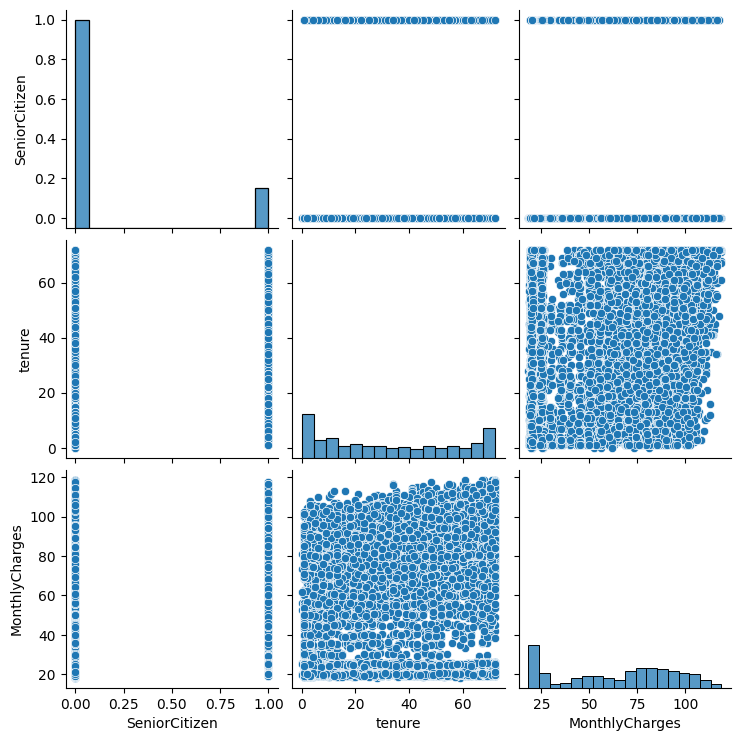

In [11]:
sns.pairplot(df);

In [12]:
df.isnull().any()

gender              False
SeniorCitizen       False
Partner             False
Dependents          False
tenure              False
PhoneService        False
MultipleLines       False
InternetService     False
OnlineSecurity      False
OnlineBackup        False
DeviceProtection    False
TechSupport         False
StreamingTV         False
StreamingMovies     False
Contract            False
PaperlessBilling    False
PaymentMethod       False
MonthlyCharges      False
TotalCharges        False
Churn               False
dtype: bool

In [14]:
df.gender.unique()

array(['Female', 'Male'], dtype=object)

In [15]:
df.Partner.unique()

array(['Yes', 'No'], dtype=object)

In [16]:
df.Dependents.unique()

array(['No', 'Yes'], dtype=object)

In [17]:
df.PhoneService.unique()

array(['No', 'Yes'], dtype=object)

In [18]:
df.InternetService.unique()	

array(['DSL', 'Fiber optic', 'No'], dtype=object)

In [19]:
df.OnlineSecurity.unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [20]:
df.OnlineBackup.unique()

array(['Yes', 'No', 'No internet service'], dtype=object)

In [21]:
df.DeviceProtection.unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [22]:
df.TechSupport.unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [23]:
df.StreamingTV.unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [24]:
df.Contract.unique()

array(['Month-to-month', 'One year', 'Two year'], dtype=object)

In [25]:
df.PaperlessBilling.unique()

array(['Yes', 'No'], dtype=object)

In [26]:
df.PaymentMethod.unique()

array(['Electronic check', 'Mailed check', 'Bank transfer (automatic)',
       'Credit card (automatic)'], dtype=object)

In [27]:
df.Churn.unique()

array(['No', 'Yes'], dtype=object)

In [29]:
from sklearn.preprocessing import OrdinalEncoder

#### Преобразуем данные типа string

In [39]:
df_order = df.copy()
enc = OrdinalEncoder()
df_order[['gender_or','partner_or', 'dependents_or',
         'phoneservice_or', 'internetservice_or',
          'onlinesecurity_or', 'onlinebackup_or', 'deviceprotection_or',
          'techsupport_or', 'streamingtv_or', 'contract_or', 'paperlessbilling_or',
          'paymentmethod_or', 'churn_or', 'multiplelines', 'streamingmovies']] = enc.fit_transform(df_order[['gender','Partner', 
                                                                                    'Dependents', 'PhoneService', 'InternetService',
                                                                                   'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                                                                                   'TechSupport', 'StreamingTV', 'Contract', 'PaperlessBilling',
                                                                                   'PaymentMethod', 'Churn', 'MultipleLines', 'StreamingMovies']])
df_order.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,onlinebackup_or,deviceprotection_or,techsupport_or,streamingtv_or,contract_or,paperlessbilling_or,paymentmethod_or,churn_or,multiplelines,streamingmovies
customerID,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,2.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,0.0,2.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,2.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0,0.0
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,0.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,0.0,0.0


In [40]:
df_order = df_order.drop(columns=['gender','Partner', 'Dependents', 'PhoneService', 'InternetService',
                                                                                   'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                                                                                   'TechSupport', 'StreamingTV', 'Contract', 'PaperlessBilling',
                                                                                   'PaymentMethod', 'Churn', 'MultipleLines', 'StreamingMovies'])

In [44]:
df.TotalCharges.unique()

array(['29.85', '1889.5', '108.15', ..., '346.45', '306.6', '6844.5'],
      dtype=object)

In [45]:
df_order.TotalCharges.info()

<class 'pandas.core.series.Series'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Series name: TotalCharges
Non-Null Count  Dtype 
--------------  ----- 
7043 non-null   object
dtypes: object(1)
memory usage: 368.1+ KB


In [46]:
df_order.TotalCharges.describe()

count     7043
unique    6531
top           
freq        11
Name: TotalCharges, dtype: object

In [47]:
df_order["TotalCharges"] = pd.to_numeric(df_order["TotalCharges"], errors="coerce")

In [48]:
df_order.head()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,gender_or,partner_or,dependents_or,phoneservice_or,internetservice_or,onlinesecurity_or,onlinebackup_or,deviceprotection_or,techsupport_or,streamingtv_or,contract_or,paperlessbilling_or,paymentmethod_or,churn_or,multiplelines,streamingmovies
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,0,1,29.85,29.85,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0
5575-GNVDE,0,34,56.95,1889.50,1.0,0.0,0.0,1.0,0.0,2.0,0.0,2.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0
3668-QPYBK,0,2,53.85,108.15,1.0,0.0,0.0,1.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0,0.0
7795-CFOCW,0,45,42.30,1840.75,1.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
9237-HQITU,0,2,70.70,151.65,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,0.0,0.0


In [54]:
df_order.describe()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,gender_or,partner_or,dependents_or,phoneservice_or,internetservice_or,onlinesecurity_or,onlinebackup_or,deviceprotection_or,techsupport_or,streamingtv_or,contract_or,paperlessbilling_or,paymentmethod_or,churn_or,multiplelines,streamingmovies
count,7043.000000,7043.000000,7043.000000,7032.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692,2283.300441,0.504756,0.483033,0.299588,0.903166,0.872923,0.790004,0.906432,0.904444,0.797104,0.985376,0.690473,0.592219,1.574329,0.265370,0.940508,0.992475
std,0.368612,24.559481,30.090047,2266.771362,0.500013,0.499748,0.458110,0.295752,0.737796,0.859848,0.880162,0.879949,0.861551,0.885002,0.833755,0.491457,1.068104,0.441561,0.948554,0.885091
min,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,9.000000,35.500000,401.450000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,29.000000,70.350000,1397.475000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,2.000000,0.000000,1.000000,1.000000
75%,0.000000,55.000000,89.850000,3794.737500,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,1.000000,2.000000,2.000000
max,1.000000,72.000000,118.750000,8684.800000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,3.000000,1.000000,2.000000,2.000000


In [ ]:
data['class'].value_counts().plot.bar(figsize=(6, 4))
plt.grid(axis='y')
plt.show()

In [50]:
df_order.corr()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,gender_or,partner_or,dependents_or,phoneservice_or,internetservice_or,onlinesecurity_or,onlinebackup_or,deviceprotection_or,techsupport_or,streamingtv_or,contract_or,paperlessbilling_or,paymentmethod_or,churn_or,multiplelines,streamingmovies
SeniorCitizen,1.000000,0.016567,0.220173,0.102411,-0.001874,0.016479,-0.211185,0.008576,-0.032310,-0.128221,-0.013632,-0.021398,-0.151268,0.030776,-0.142554,0.156530,-0.038551,0.150889,0.146185,0.047266
tenure,0.016567,1.000000,0.247900,0.825880,0.005106,0.379697,0.159712,0.008448,-0.030359,0.325468,0.370876,0.371105,0.322942,0.289373,0.671607,0.006152,-0.370436,-0.352229,0.343032,0.296866
MonthlyCharges,0.220173,0.247900,1.000000,0.651065,-0.014569,0.096848,-0.113890,0.247398,-0.323260,-0.053878,0.119777,0.163652,-0.008682,0.336706,-0.074195,0.352150,-0.193407,0.193356,0.433576,0.335459
TotalCharges,0.102411,0.825880,0.651065,1.000000,0.000048,0.319072,0.064653,0.113008,-0.175691,0.254473,0.375556,0.389066,0.276890,0.392472,0.450306,0.157830,-0.330594,-0.199484,0.453202,0.398088
gender_or,-0.001874,0.005106,-0.014569,0.000048,1.000000,-0.001808,0.010517,-0.006488,-0.000863,-0.015017,-0.012057,0.000549,-0.006825,-0.006421,0.000126,-0.011754,0.017352,-0.008612,-0.006739,-0.008743
partner_or,0.016479,0.379697,0.096848,0.319072,-0.001808,1.000000,0.452676,0.017706,0.000891,0.150828,0.153130,0.166330,0.126733,0.137341,0.294806,-0.014877,-0.154798,-0.150448,0.142410,0.129574
dependents_or,-0.211185,0.159712,-0.113890,0.064653,0.010517,0.452676,1.000000,-0.001762,0.044590,0.152166,0.091015,0.080537,0.133524,0.046885,0.243187,-0.111377,-0.040292,-0.164221,-0.024991,0.021321
phoneservice_or,0.008576,0.008448,0.247398,0.113008,-0.006488,0.017706,-0.001762,1.000000,0.387436,-0.015198,0.024105,0.003727,-0.019158,0.055353,0.002247,0.016505,-0.004184,0.011942,-0.020538,0.043870
internetservice_or,-0.032310,-0.030359,-0.323260,-0.175691,-0.000863,0.000891,0.044590,0.387436,1.000000,-0.028416,0.036138,0.044944,-0.026047,0.107417,0.099721,-0.138625,0.086140,-0.047291,-0.109216,0.098350
onlinesecurity_or,-0.128221,0.325468,-0.053878,0.254473,-0.015017,0.150828,0.152166,-0.015198,-0.028416,1.000000,0.185126,0.175985,0.285028,0.044669,0.374416,-0.157641,-0.096726,-0.289309,0.007141,0.055954


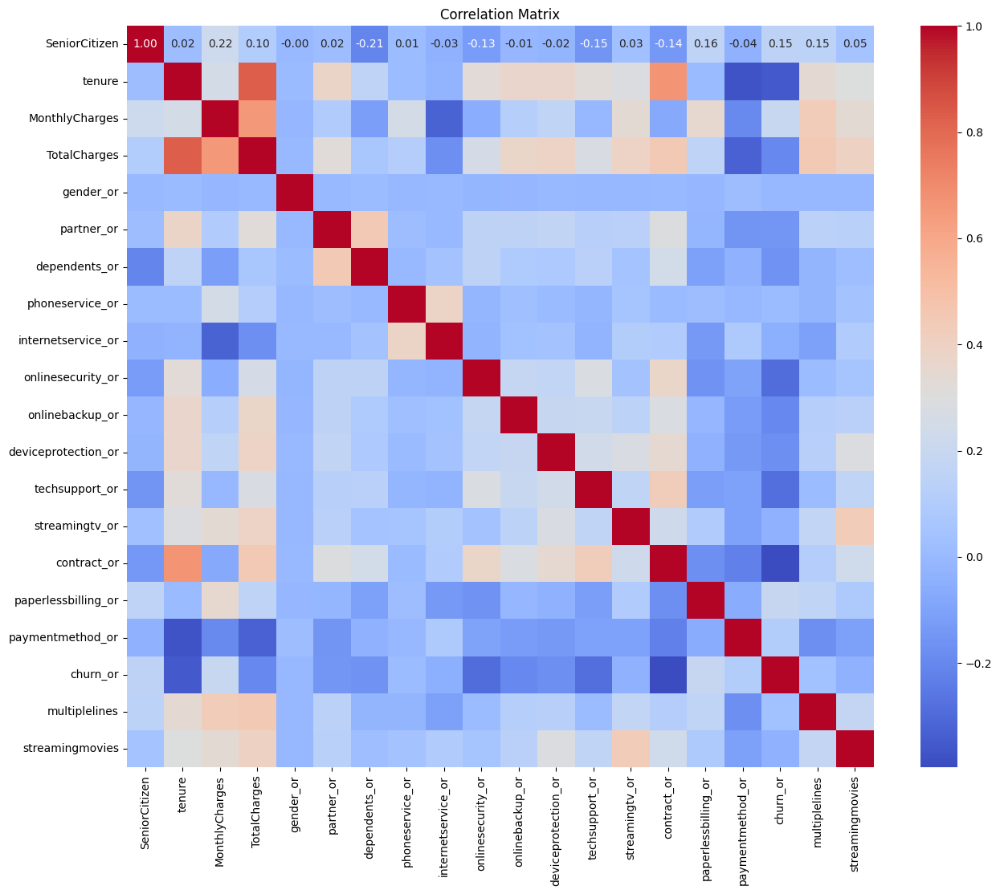

In [51]:
plt.figure(figsize=(15, 12))
sns.heatmap(df_order.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

#### Распределение целевой переменной

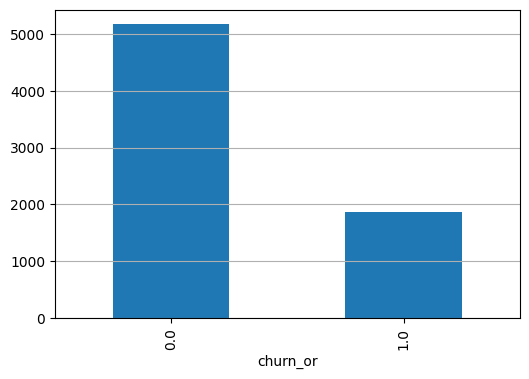

In [57]:
df_order['churn_or'].value_counts().plot.bar(figsize=(6, 4))
plt.grid(axis='y')
plt.show()

In [58]:
df_order['churn_or'].value_counts(normalize=True)

churn_or
0.0    0.73463
1.0    0.26537
Name: proportion, dtype: float64

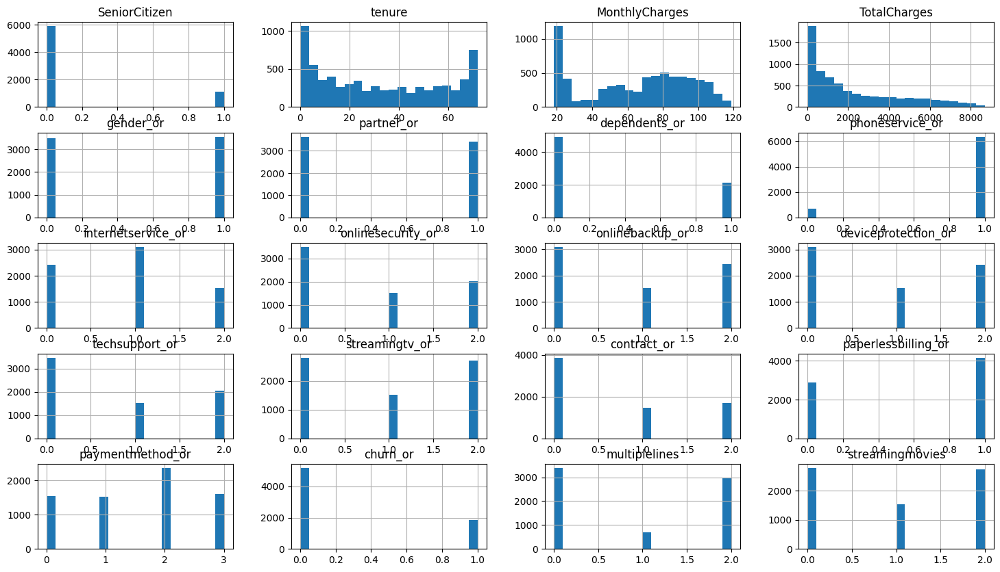

In [59]:
df_order.hist(figsize=(18, 10), bins=20);

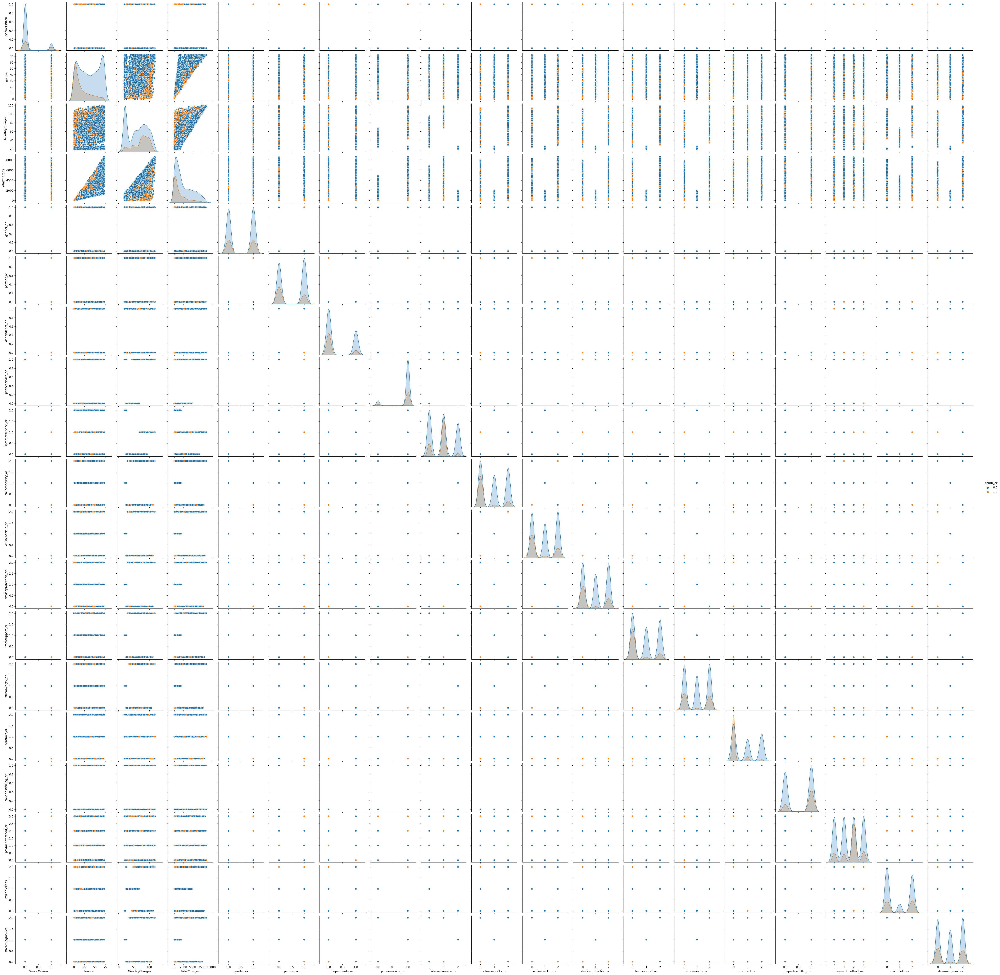

In [60]:
sns.pairplot(df_order, hue='churn_or');

## Часть 2. Preprocessing & Feature Engineering

In [88]:
from sklearn.preprocessing import LabelEncoder
 
labelencoder = LabelEncoder()
 
df_le = df.copy()
 

df_le.loc[:, 'gender'] = labelencoder.fit_transform(df_le.loc[:, 'gender'])
df_le.loc[:, 'Partner'] = labelencoder.fit_transform(df_le.loc[:, 'Partner'])
df_le.loc[:, 'Dependents'] = labelencoder.fit_transform(df_le.loc[:, 'Dependents'])
df_le.loc[:, 'PhoneService'] = labelencoder.fit_transform(df_le.loc[:, 'PhoneService'])
df_le.loc[:, 'InternetService'] = labelencoder.fit_transform(df_le.loc[:, 'InternetService'])
df_le.loc[:, 'OnlineSecurity'] = labelencoder.fit_transform(df_le.loc[:, 'OnlineSecurity'])
df_le.loc[:, 'OnlineBackup'] = labelencoder.fit_transform(df_le.loc[:, 'OnlineBackup'])
df_le.loc[:, 'DeviceProtection'] = labelencoder.fit_transform(df_le.loc[:, 'DeviceProtection'])
df_le.loc[:, 'TechSupport'] = labelencoder.fit_transform(df_le.loc[:, 'TechSupport'])
df_le.loc[:, 'StreamingTV'] = labelencoder.fit_transform(df_le.loc[:, 'StreamingTV'])
df_le.loc[:, 'Contract'] = labelencoder.fit_transform(df_le.loc[:, 'Contract'])
df_le.loc[:, 'PaperlessBilling'] = labelencoder.fit_transform(df_le.loc[:, 'PaperlessBilling'])
df_le.loc[:, 'PaymentMethod'] = labelencoder.fit_transform(df_le.loc[:, 'PaymentMethod'])
df_le.loc[:, 'Churn'] = labelencoder.fit_transform(df_le.loc[:, 'Churn'])
df_le.loc[:, 'MultipleLines'] = labelencoder.fit_transform(df_le.loc[:, 'MultipleLines'])
df_le.loc[:, 'StreamingMovies'] = labelencoder.fit_transform(df_le.loc[:, 'StreamingMovies'])

df_le.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,0,0,1,0,1,0,1,0,0,2,0,0,0,0,0,1,2,29.85,29.85,0
5575-GNVDE,1,0,0,0,34,1,0,0,2,0,2,0,0,0,1,0,3,56.95,1889.5,0
3668-QPYBK,1,0,0,0,2,1,0,0,2,2,0,0,0,0,0,1,3,53.85,108.15,1
7795-CFOCW,1,0,0,0,45,0,1,0,2,0,2,2,0,0,1,0,0,42.30,1840.75,0
9237-HQITU,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,151.65,1


In [89]:
df_le["TotalCharges"] = pd.to_numeric(df_le["TotalCharges"], errors="coerce")

In [90]:
df_le.isnull().any()

gender              False
SeniorCitizen       False
Partner             False
Dependents          False
tenure              False
PhoneService        False
MultipleLines       False
InternetService     False
OnlineSecurity      False
OnlineBackup        False
DeviceProtection    False
TechSupport         False
StreamingTV         False
StreamingMovies     False
Contract            False
PaperlessBilling    False
PaymentMethod       False
MonthlyCharges      False
TotalCharges         True
Churn               False
dtype: bool

In [91]:
df_le.TotalCharges.isnull().any().sum()

1

In [92]:
df_le.dropna(subset = ['TotalCharges'], inplace = True)  

#### удаляем колонки, которые имеют низкую корреляцию с целевой переменной

In [93]:
df_le = df_le.drop(columns=['gender', 'PhoneService', 'InternetService', 'StreamingTV','MultipleLines', 'StreamingMovies'])

In [94]:
df_le.head()

,SeniorCitizen,Partner,Dependents,tenure,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,
7590-VHVEG,0,1,0,1,0,2,0,0,0,1,2,29.85,29.85,0
5575-GNVDE,0,0,0,34,2,0,2,0,1,0,3,56.95,1889.50,0
3668-QPYBK,0,0,0,2,2,2,0,0,0,1,3,53.85,108.15,1
7795-CFOCW,0,0,0,45,2,0,2,2,1,0,0,42.30,1840.75,0
9237-HQITU,0,0,0,2,0,0,0,0,0,1,2,70.70,151.65,1


In [113]:
df_le.Churn

customerID
7590-VHVEG    0
5575-GNVDE    0
3668-QPYBK    1
7795-CFOCW    0
9237-HQITU    1
             ..
6840-RESVB    0
2234-XADUH    0
4801-JZAZL    0
8361-LTMKD    1
3186-AJIEK    0
Name: Churn, Length: 7032, dtype: object

#### Делим данные на train и test

In [114]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    df_le.drop(['Churn'], axis=1), df_le['Churn'], test_size=0.20, random_state=42
)


In [96]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5625, 13), (1407, 13), (5625,), (1407,))

In [97]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [98]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score



In [102]:
y_train.describe()

count     5625
unique       2
top          0
freq      4130
Name: Churn, dtype: int64

In [ ]:
n_estimators = 200

X, y = make_hastie_10_2(n_samples=10000)
X_test, y_test = make_hastie_10_2(n_samples=10000)
est = GradientBoostingClassifier(n_estimators=200, max_depth=3)
est.fit(X, y)

pred = est.predict(X)
est.predict_proba(X)[0]
print('accuracy', round(accuracy_score(y_test, est.predict(X_test)),3))

In [107]:
y_train = y_train.astype('int')
y_test = y_test.astype('int')

## Часть 3. Who's the mightiest of them all?

### 3.1 GradientBoostingClassifier

#### Обучим градиентный бустинг из коробки, реализация из sklearn

In [176]:
from sklearn.metrics import *

In [180]:
X_test_scaled.shape

(1407, 13)

In [183]:
gbm = GradientBoostingClassifier(n_estimators=250, learning_rate=0.2, verbose=True).fit(X_train_scaled, y_train)
print(roc_auc_score(y_test, gbm.predict_proba(X_test_scaled)[:, 1]))

      Iter       Train Loss   Remaining Time 
         1           1.1544            1.74s
         2           1.1518            1.61s
         3           1.1493            1.64s
         4           1.1470            1.72s
         5           1.1448            1.76s
         6           1.1431            1.78s
         7           1.1401            1.80s
         8           1.1390            1.81s
         9           1.1370            1.79s
        10           1.1344            1.80s
        20           1.1198            1.65s
        30           1.1061            1.51s
        40           1.0949            1.39s
        50           1.0808            1.28s
        60           1.0684            1.19s
        70           1.0561            1.11s
        80           1.0464            1.04s
        90           1.0354            0.98s
       100           1.0264            0.91s
       200           0.9346            0.29s
0.4898703739174099


### 3.2 LGBMClassifier

In [111]:
from lightgbm import LGBMClassifier # sklearn-like API, but it's not the only one available
import lightgbm as lgb

In [120]:
X_train.columns

Index(['SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'Contract',
       'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges', 'TotalCharges'],
      dtype='object')

In [122]:
X_train.head()

,SeniorCitizen,Partner,Dependents,tenure,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
customerID,,,,,,,,,,,,,
2027-OAQQC,0,0,0,43,0,0,2,0,0,1,0,49.05,2076.20
4918-QLLIW,0,0,0,3,0,0,0,0,0,0,1,53.40,188.70
5536-SLHPM,0,1,0,55,0,0,2,0,0,1,2,77.75,4458.15
1716-LSAMB,0,1,1,45,2,0,0,2,2,0,0,54.65,2553.70
2696-ECXKC,0,1,1,55,2,0,0,0,1,0,3,100.90,5448.60


In [116]:
#X_train['SeniorCitizen'] = X_train['SeniorCitizen'].astype('int')
#X_train['Partner'] = X_train['Partner'].astype('int')
#X_train['Dependents'] = X_train['Dependents'].astype('int')
#X_train['tenure']. = X_train['tenure'].astype('int')
#X_train = X_train['OnlineSecurity'].astype('int')
#X_train = X_train['OnlineBackup'].astype('int')
#X_train = X_train['DeviceProtection'].astype('int')
#X_train = X_train['TechSupport'].astype('int')
#X_train = X_train['Contract'].astype('int')
#X_train = X_train['PaperlessBilling'].astype('int')
#X_train['PaymentMethod'] = X_train['PaymentMethod'].astype('int')
#X_train['MonthlyCharges'] = X_train['MonthlyCharges'].astype('int')
#X_train['TotalCharges'] = X_train['TotalCharges'].astype('int')

#X_test = X_test.astype('int')
y_train = y_train.astype('int')
y_test = y_test.astype('int')

In [128]:
lgbm = LGBMClassifier(n_estimators=300)
lgbm.fit(X_train_scaled, y_train)

print(roc_auc_score(y_test, lgbm.predict_proba(X_test_scaled)[:, 1]))

[LightGBM] [Info] Number of positive: 1495, number of negative: 4130
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 620
[LightGBM] [Info] Number of data points in the train set: 5625, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265778 -> initscore=-1.016151
[LightGBM] [Info] Start training from score -1.016151
0.4992144265961247


### 3.3 Catboost

In [129]:
from catboost import CatBoostClassifier

cblf = CatBoostClassifier(iterations=300, logging_level='Silent')
cblf.fit(X_train_scaled, y_train)
#plot_surface(X_test_scaled, y_test, clf)

print(roc_auc_score(y_test, cblf.predict_proba(X_test_scaled)[:, 1]))

0.5083177599122022


### 3.4 XGBoost

In [132]:
from xgboost import XGBClassifier

xgb = XGBClassifier(iterations=300, logging_level='Silent')
xgb.fit(X_train_scaled, y_train)
#plot_surface(X_test_scaled, y_test, clf)

print(roc_auc_score(y_test, xgb.predict_proba(X_test_scaled)[:, 1]))

0.5012721888896366


### Выводы:
#### Ни одна из моделей с параметрами из коробки не дает хороших результатов. Фактически каждая из модель ROC-AUC примерно равно 0.5
#### У нас модель строится по сути на бинарной классификации, т.е. легче попасть пальцем в небо, чем использовать одну из моделей.
#### CatBoost удивил - обычно он из коробки дает очень даже неплохие результаты

### 3.5. Кросс-валидация (k-fold cross-validation)

### 3.5.1. LightGBM

In [134]:
from sklearn.metrics import accuracy_score, f1_score
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV

In [ ]:
pipe_lgbm = make_pipeline(StandardScaler(), LGBMClassifier())

parameters_lgbm = { 
    'standardscaler__with_mean': [True,False],
    'lgbmclassifier__n_estimators': [1, 5, 10, 100, 200, 300, 400, 500, 600, 700, 800, 850, 900, 950, 1000, 1200, 1500],
    'lgbmclassifier__subsample': [1,3,5,7,9],
    'lgbmclassifier__max_depth': [1,2,3, 5, 7, 9]
    }

grid_search_lgbm = GridSearchCV(pipe_lgbm, param_grid=parameters_lgbm, verbose = True,  scoring='accuracy')

grid_search_lgbm.fit(X_train, y_train)

Fitting 5 folds for each of 1020 candidates, totalling 5100 fits
[LightGBM] [Info] Number of positive: 1196, number of negative: 3304
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 620
[LightGBM] [Info] Number of data points in the train set: 4500, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265778 -> initscore=-1.016151
[LightGBM] [Info] Start training from score -1.016151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1196, number of negative: 3304
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] 

In [141]:
grid_search_lgbm.best_params_

{'lgbmclassifier__max_depth': 2,
 'lgbmclassifier__n_estimators': 200,
 'lgbmclassifier__subsample': 1,
 'standardscaler__with_mean': False}

In [142]:
pipe_lgbm = Pipeline([('standardscaler', StandardScaler()), ('lgbmclassifier', LGBMClassifier())])
pipe_lgbm.set_params(**grid_search_lgbm.best_params_)
pipe_lgbm.fit(X_train, y_train)
pred_lgbm = pipe_lgbm.predict(X_test)
print('Accuracy', accuracy_score(y_test,pred_lgbm))

[LightGBM] [Info] Number of positive: 1495, number of negative: 4130
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 5625, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265778 -> initscore=-1.016151
[LightGBM] [Info] Start training from score -1.016151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

In [184]:
print(roc_auc_score(y_test, pipe_lgbm.predict_proba(X_test)[:, 1]))

0.8343993145969115


In [ ]:
from sklearn.metrics import classification_report, mean_squared_error

In [145]:
print(classification_report(y_test, pred_lgbm))

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1033
           1       0.64      0.50      0.56       374

    accuracy                           0.79      1407
   macro avg       0.74      0.70      0.71      1407
weighted avg       0.78      0.79      0.78      1407



#### 3.5.1.1. Важность признаков по модели LGBM

In [146]:
feature_importances_s = zip(X_train.columns,  pipe_lgbm.steps[1][1].feature_importances_)
list(feature_importances_s)

[('SeniorCitizen', 17),
 ('Partner', 4),
 ('Dependents', 10),
 ('tenure', 107),
 ('OnlineSecurity', 24),
 ('OnlineBackup', 10),
 ('DeviceProtection', 5),
 ('TechSupport', 13),
 ('Contract', 31),
 ('PaperlessBilling', 20),
 ('PaymentMethod', 45),
 ('MonthlyCharges', 164),
 ('TotalCharges', 150)]

### 3.5.2. GradientBoostingClassifier

In [150]:
pipe_gbcl = make_pipeline(StandardScaler(), GradientBoostingClassifier())

parameters_gbcl = { 
    'standardscaler__with_mean': [True,False],
    'gradientboostingclassifier__n_estimators': [1, 5, 10, 100, 200, 300, 400, 500, 600, 700, 800, 850, 900, 950, 1000, 1200, 1500],
    'gradientboostingclassifier__subsample': [1,3,5,7,9],
    'gradientboostingclassifier__max_depth': [1,2,3, 5, 7, 9]
    }

grid_search_gbcl = GridSearchCV(pipe_gbcl, param_grid=parameters_gbcl, verbose = True,  scoring='accuracy')

grid_search_gbcl.fit(X_train, y_train)

Fitting 5 folds for each of 1020 candidates, totalling 5100 fits


GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('gradientboostingclassifier',
                                        GradientBoostingClassifier())]),
             param_grid={'gradientboostingclassifier__max_depth': [1, 2, 3, 5,
                                                                   7, 9],
                         'gradientboostingclassifier__n_estimators': [1, 5, 10,
                                                                      100, 200,
                                                                      300, 400,
                                                                      500, 600,
                                                                      700, 800,
                                                                      850, 900,
                                                                      950, 1000,
                                                                      1200,
                                                                      1500],
                         'gradientboostingclassifier__subsample': [1, 3, 5, 7,
                                                                   9],
                         'standardscaler__with_mean': [True, False]},
             scoring='accuracy', verbose=True)

In [152]:
grid_search_gbcl.best_params_

{'gradientboostingclassifier__max_depth': 1,
 'gradientboostingclassifier__n_estimators': 1000,
 'gradientboostingclassifier__subsample': 1,
 'standardscaler__with_mean': True}

In [158]:
pipe_gbcl = Pipeline([('standardscaler', StandardScaler()), ('gradientboostingclassifier', GradientBoostingClassifier())])
pipe_gbcl.set_params(**grid_search_gbcl.best_params_)
pipe_gbcl.fit(X_train, y_train)
pred_gbcl = pipe_gbcl.predict(X_test)
print('Accuracy', accuracy_score(y_test,pred_gbcl))

Accuracy 0.7931769722814499


In [186]:
print(roc_auc_score(y_test, pipe_gbcl.predict_proba(X_test)[:, 1]))

0.8365360224878476


In [159]:
print(classification_report(y_test, pred_gbcl))

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1033
           1       0.64      0.50      0.56       374

    accuracy                           0.79      1407
   macro avg       0.74      0.70      0.71      1407
weighted avg       0.78      0.79      0.78      1407



#### 3.5.2.1. Важность признаков по модели GradientBoostingClassifier

In [160]:
feature_importances_gbcl = zip(X_train.columns,  pipe_gbcl.steps[1][1].feature_importances_)
list(feature_importances_gbcl)

[('SeniorCitizen', 0.012586181246231029),
 ('Partner', 0.00016136818898578644),
 ('Dependents', 0.002496710258931457),
 ('tenure', 0.20757113715389325),
 ('OnlineSecurity', 0.13214904102758843),
 ('OnlineBackup', 0.00884786588139184),
 ('DeviceProtection', 0.000345673671783532),
 ('TechSupport', 0.0974285344670075),
 ('Contract', 0.35862080720624756),
 ('PaperlessBilling', 0.012737210449110584),
 ('PaymentMethod', 0.013353585737870084),
 ('MonthlyCharges', 0.12735359641009908),
 ('TotalCharges', 0.026348288300859852)]

### 3.5.3. Catboost

In [ ]:
pipe_catbl = make_pipeline(StandardScaler(), CatBoostClassifier())

parameters_catbl = { 
    'standardscaler__with_mean': [True,False],
    'catboostclassifier__n_estimators': [1, 5, 10, 100, 200, 300, 400, 500, 600, 700, 800, 850, 900, 950, 1000, 1200],
    'catboostclassifier__subsample': [1,3,5,7,9],
    'catboostclassifier__max_depth': [1,2,3, 5, 7, 9]
    }

grid_search_catbl = GridSearchCV(pipe_catbl, param_grid=parameters_catbl, verbose = True,  scoring='accuracy')

grid_search_catbl.fit(X_train, y_train)

Fitting 5 folds for each of 960 candidates, totalling 4800 fits
Learning rate set to 0.5
0:	learn: 0.5593494	total: 462us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5744862	total: 517us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5581545	total: 396us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5606679	total: 396us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5629716	total: 388us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5593494	total: 478us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5744862	total: 387us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5581545	total: 335us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5606679	total: 443us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5629716	total: 352us	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.5593494	total: 416us	remaining: 1.66ms
1:	learn: 0.5093666	total: 802us	remaining: 1.2ms
2:	learn: 0.4855669	total: 1.2ms	remaining: 799us
3:	learn: 0.4663855	total: 1.6

In [164]:
grid_search_catbl.best_params_

{'catboostclassifier__max_depth': 1,
 'catboostclassifier__n_estimators': 400,
 'catboostclassifier__subsample': 1,
 'standardscaler__with_mean': True}

In [166]:
pipe_catbl = Pipeline([('standardscaler', StandardScaler()), ('catboostclassifier', CatBoostClassifier())])
pipe_catbl.set_params(**grid_search_catbl.best_params_)
pipe_catbl.fit(X_train, y_train)
pred_catbl = pipe_catbl.predict(X_test)
print('Accuracy', accuracy_score(y_test,pred_catbl))

Learning rate set to 0.049905
0:	learn: 0.6675614	total: 1.98ms	remaining: 791ms
1:	learn: 0.6451422	total: 3.49ms	remaining: 695ms
2:	learn: 0.6254963	total: 4.93ms	remaining: 652ms
3:	learn: 0.6083179	total: 6.39ms	remaining: 633ms
4:	learn: 0.5957345	total: 7.95ms	remaining: 628ms
5:	learn: 0.5845963	total: 9.34ms	remaining: 613ms
6:	learn: 0.5737668	total: 10.8ms	remaining: 604ms
7:	learn: 0.5659350	total: 12ms	remaining: 587ms
8:	learn: 0.5569567	total: 13.4ms	remaining: 584ms
9:	learn: 0.5468126	total: 14.8ms	remaining: 577ms
10:	learn: 0.5399525	total: 16.2ms	remaining: 572ms
11:	learn: 0.5333287	total: 17.6ms	remaining: 570ms
12:	learn: 0.5277667	total: 19ms	remaining: 567ms
13:	learn: 0.5227033	total: 20.3ms	remaining: 559ms
14:	learn: 0.5176157	total: 21.7ms	remaining: 556ms
15:	learn: 0.5113736	total: 23ms	remaining: 551ms
16:	learn: 0.5058862	total: 24.3ms	remaining: 548ms
17:	learn: 0.5010751	total: 25.8ms	remaining: 547ms
18:	learn: 0.4981131	total: 27.1ms	remaining: 543m

In [187]:
print(roc_auc_score(y_test, pipe_catbl.predict_proba(X_test)[:, 1]))

0.8325861542364018


In [167]:
print(classification_report(y_test, pred_catbl))

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1033
           1       0.64      0.50      0.56       374

    accuracy                           0.79      1407
   macro avg       0.74      0.70      0.71      1407
weighted avg       0.78      0.79      0.78      1407



#### 3.5.3.1. Важность признаков по модели Catboost

In [168]:
feature_importances_catbl = zip(X_train.columns,  pipe_catbl.steps[1][1].feature_importances_)
list(feature_importances_catbl)

[('SeniorCitizen', 0.9196671142712184),
 ('Partner', 0.0),
 ('Dependents', 0.4005578191587903),
 ('tenure', 17.683465805728297),
 ('OnlineSecurity', 13.00796971140855),
 ('OnlineBackup', 0.8057548448757464),
 ('DeviceProtection', 0.0),
 ('TechSupport', 10.617496470922838),
 ('Contract', 40.57942290022409),
 ('PaperlessBilling', 1.6258045498306017),
 ('PaymentMethod', 1.8890605935954992),
 ('MonthlyCharges', 11.6934221095158),
 ('TotalCharges', 0.7773780804685941)]

### 3.5.4. XGBoost

In [170]:
pipe_xgbl = make_pipeline(StandardScaler(), XGBClassifier())

parameters_xgbl = { 
    'standardscaler__with_mean': [True,False],
    'xgbclassifier__n_estimators': [1, 5, 10, 100, 200, 300, 400, 500, 600, 700, 800, 850, 900, 950, 1000, 1200],
    'xgbclassifier__subsample': [1,3,5,7,9],
    'xgbclassifier__max_depth': [1,2,3, 5, 7, 9]
    }

grid_search_xgbl = GridSearchCV(pipe_xgbl, param_grid=parameters_xgbl, verbose = True,  scoring='accuracy')

grid_search_xgbl.fit(X_train, y_train)

Fitting 5 folds for each of 960 candidates, totalling 4800 fits


GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('xgbclassifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      device=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      gamma=None,
                                                      grow_policy=None,
                                                      impor...
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      random_state=None, ...))]),
             param_grid={'standardscaler__with_mean': [True, False],
                         'xgbclassifier__max_depth': [1, 2, 3, 5, 7, 9],
                         'xgbclassifier__n_estimators': [1, 5, 10, 100, 200,
                                                         300, 400, 500, 600,
                                                         700, 800, 850, 900,
                                                         950, 1000, 1200],
                         'xgbclassifier__subsample': [1, 3, 5, 7, 9]},
             scoring='accuracy', verbose=True)

In [171]:
grid_search_gbcl.best_params_

{'gradientboostingclassifier__max_depth': 1,
 'gradientboostingclassifier__n_estimators': 1000,
 'gradientboostingclassifier__subsample': 1,
 'standardscaler__with_mean': True}

In [173]:
pipe_xgbl = Pipeline([('standardscaler', StandardScaler()), ('xgbclassifier', XGBClassifier())])
pipe_xgbl.set_params(**grid_search_xgbl.best_params_)
pipe_xgbl.fit(X_train, y_train)
pred_xgbl = pipe_gbcl.predict(X_test)
print('Accuracy', accuracy_score(y_test,pred_xgbl))

Accuracy 0.7931769722814499


In [188]:
print(roc_auc_score(y_test, pipe_xgbl.predict_proba(X_test)[:, 1]))

0.8343695482241124


In [174]:
print(classification_report(y_test, pred_xgbl))

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1033
           1       0.64      0.50      0.56       374

    accuracy                           0.79      1407
   macro avg       0.74      0.70      0.71      1407
weighted avg       0.78      0.79      0.78      1407



#### 3.5.4.1. Важность признаков по модели XGBoost

In [175]:
feature_importances_xgbl = zip(X_train.columns,  pipe_xgbl.steps[1][1].feature_importances_)
list(feature_importances_xgbl)

[('SeniorCitizen', 0.012634602),
 ('Partner', 0.0),
 ('Dependents', 0.009248071),
 ('tenure', 0.039353058),
 ('OnlineSecurity', 0.3819708),
 ('OnlineBackup', 0.0107138),
 ('DeviceProtection', 0.0),
 ('TechSupport', 0.22266783),
 ('Contract', 0.26738814),
 ('PaperlessBilling', 0.018694405),
 ('PaymentMethod', 0.008131686),
 ('MonthlyCharges', 0.026463047),
 ('TotalCharges', 0.0027347277)]

#### Оценки моделей:
#### а) LightGBM
####    ROC_AUC = 0.8343993145969115
#### б) GradientBoostingClassifier
####    ROC_AUC = 0.8365360224878476
#### в) Catboost
####    ROC_AUC = 0.8325861542364018
#### г) XGBoost
####    ROC_AUC = 0.8343695482241124

#### Выводы
#### 1) все модели показали хорошие результаты с наилучшими параметрами
#### 2) все модели показали примерно одинаковые результаты
#### 3) учитывая какие результаты мы получили при использовании параметров по умолчанию, приходим к следующему заключению: как важно подбирать параметры для модели
#### 4) фактически мы использовали такие данные, которые не дают преимущество ни одной из моделей, а значит при выборе модели можно использовать другие критерии для выбора одной из них, напрмиер, на скорости обработки данных
#### 5) необходимо отметить, что в некоторых моделях важность одних параметров в принятии рещения оказывалось большим, чем в других